(nn/01-intro)=
# Introduction

![Status](https://img.shields.io/static/v1.svg?label=Status&message=Finished&color=brightgreen)
[![Source](https://img.shields.io/static/v1.svg?label=GitHub&message=Source&color=181717&logo=GitHub)](https://github.com/particle1331/ok-transformer/blob/master/docs/nb/dl/01-intro.ipynb)
[![Stars](https://img.shields.io/github/stars/particle1331/ok-transformer?style=social)](https://github.com/particle1331/ok-transformer)

---

**Readings:** [[CS182-lec1]](https://cs182sp21.github.io/static/slides/lec-1.pdf) [[CS182-lec2]](https://cs182sp21.github.io/static/slides/lec-2.pdf) [[CS182-lec3]](https://cs182sp21.github.io/static/slides/lec-3.pdf) [[CS4780-lec12]](https://www.cs.cornell.edu/courses/cs4780/2018sp/lectures/lecturenote12.html)

## Introduction

The power of deep learning (DL) is that allows automatically learning **representations** from data.
This is evident in machine translation applications where words are not translated 1-1 between 
words in two languages ({numref}`01-thought`). Instead, an intermediate representation is learned between translated phrases.

```{figure} ../../img/nn/01-thought.png
---
name: 01-thought
width: 80%
---
Thought is a representation.
```

Recall that learning parameters of a parametric model that minimizes the task objective (e.g. prediction error). 
For our purposes, deep learning is machine learning with multiple layers of learned representations. Here a layer is any parametric transformation. Finally, any function with multiple layers of representation will be called a **neural network**. What makes DL work:
* big models with many layers
* large datasets with many examples.
* requires large compute

Is more layers better? Generally, yes ({numref}`01-imagenet-progress`). Higher level features are more abstract and invariant to noise which makes it easier to learn labels. 
This requires large models with many layers
This also requires large datasets with many examples of all different scenarios. This is necessary for complexity of distributions that it tries to learn. Both these requirements necessitate large compute ({numref}`01-gflops`).

```{figure} ../../img/nn/01-imagenet-progress.png
---
name: 01-imagenet-progress
width: 80%
---
Progress in top-5 error in the [ImageNet competition](https://en.wikipedia.org/wiki/ImageNet#ImageNet_Challenge).
```

```{figure} ../../img/nn/01-gflops.png
---
name: 01-gflops
width: 80%
---
ResNets are in the middle of the graph. GFlops are a good metric since a network can have large compute with small number of parameters (e.g. convolutions).
```

Since DL is so expensive, it is natural to ask whether it is a good idea.
The tradeoff is that DL models have so high **capacity** and are immediately
**scalable** 
that as we add more layers, more data, and more compute, the 
models just get better and better. Moreover,
DL models acquire representations end-to-end purely from the data without requiring 
manual engineering of features or representations. 
Such representations are better tailored to the
current task and minimizes **inductive bias**. 
Indeed, DL has been able to beat several human
benchmark on specific tasks tasks {cite}`mnih2015human` {cite}`bert`.

**Remark** (informally)**.** Model capacity refers to how many different functions a 
particular model class can represent. Roughly if model capacity is sufficiently large, its function space contains the true function that underlies the task. It is not necessarily true that models with
more parameters are more complex. The model $f_{a, b}(x) = a\sin(bx)$ has only two parameters
but it can interpolate any number of points by oscillating with a high enough frequency. 
Inductive bias refers to built-in knowledge or biases in a model
designed to help it learned. All such
knowledge is "bias" in the sense that
it makes some solutions more likely
and some less likely. Scaling is the ability for an 
algorithm to work better as more data and model capacity is added.

## Universal Approximation

It turns out that fully-connected neural networks can approximate any continuous function on a closed and bounded set. This property is known as [universal approximation](https://en.wikipedia.org/wiki/Universal_approximation_theorem). In other words, any true function for a task can be approximated using a neural network if it exists. Recall that **fully connected neural networks** (FCNN) consist of **linear** or **dense layers** followed by nonlinearities:

$$z_k = \varphi(\mathbf{x} \cdot \mathbf{w}_k + b_k)$$

This can be written as matrix multiplication: $\mathbf{z} = \varphi\left(\mathbf{x}\mathbf{W} + \mathbf{b}\right)$ if we write the input $\mathbf{x}$ with shape $(B, d)$ where $d$ is the number of features and $B$ is the number of instances that are processed in parallel. The following approximates a one-dimensional curve using a neural network with [ReLU activation](https://en.wikipedia.org/wiki/Rectifier_(neural_networks)):

In [1]:
import torch

# Ground truth
x = torch.linspace(-2*torch.pi, 2*torch.pi, 1000)
y = torch.sin(x) + 0.3 * x

# Get (sorted) sample
B = torch.randint(0, 1000, size=(24,))
B = torch.sort(B)[0]
xs = x[B]
ys = y[B]

# ReLU approximation
z = torch.zeros(1000,)
for i in range(len(xs) - 1):
    if torch.isclose(xs[i + 1], xs[i]):
        m = torch.tensor(0.0)
    else:
        M = (ys[i+1] - ys[i]) / (xs[i+1] - xs[i])
        s, m = torch.sign(M), torch.abs(M)
    z += s * (torch.relu(m * (x - xs[i])) - torch.relu(m * (x - xs[i+1])))
z += ys[0]

Note this only works (consistent with the theorem) for target function with domain `[a, b]`.

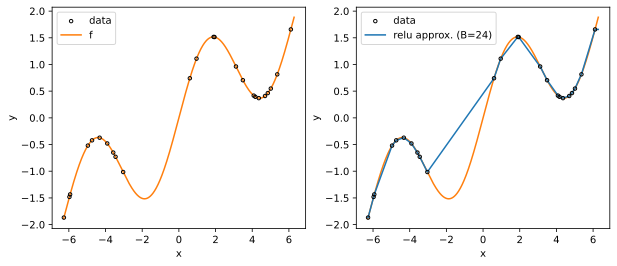

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib_inline import backend_inline
backend_inline.set_matplotlib_formats('svg')

# Plotting
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
ax[0].scatter(xs, ys, facecolor='none', s=12, edgecolor='k', zorder=3, label='data')
ax[0].plot(x, y, color="C1", label='f')
ax[0].set_xlabel('x')
ax[0].set_ylabel('y')
ax[0].legend();

ax[1].scatter(xs, ys, facecolor='none', s=12, edgecolor='k', zorder=4, label='data')
ax[1].plot(x, z, color="C0", label=f'relu approx. (B={len(B)})', zorder=3)
ax[1].plot(x, y, color="C1")
ax[1].set_xlabel('x')
ax[1].set_ylabel('y')
ax[1].legend();

This works by constructing `___/‾‾‾` and `‾‾‾\___` functions similar to step functions but with slope in between adjacent points. The step functions increment each other starting with the constant function `ys[0]`. Note this correctly ends with a constant function `ys[-1]`.

## Linear classification

Neural networks learn separating hyperplanes after a sequence of transformations (layers) on the input data for classification tasks. The intermediate outputs of the layers are what we call representations. The distances of a data point to these hyperplanes are used as class scores or **logits**. Note that instead of labels, we want to predict probabilities since these can be perturbed. Note that we can apply any positive function $f$ to class scores to convert it to a probability vector:

$$p_j = \frac{f(s_j)}{\sum_k f(s_k)}.$$

A good choice for $f$ is the exponential function which maps $\mathbb R$ to $\mathbb R^+$ one-to-one. The resulting function is called the **softmax function**:

$$\text{softmax}(\mathbf{s})_j = p_j = \frac{e^{s_j}}{\sum_k e^{s_k}}.$$

**Remark.** Notice that for binary classification we recover the **sigmoid**: $p_1 = {1}/\left(1 + e^{-(s_1 - s_0)}\right)$. This is [logistic regression](https://en.wikipedia.org/wiki/Logistic_regression) if we are using a single layer neural network with $s_k = \mathbf{w}_k \cdot \mathbf{x}$ so that $s_1 - s_0 = (\mathbf{w}_1 - \mathbf{w}_0) \cdot \mathbf{x}$. Since we learn a weight vector for each class, there are generally as many separating hyperplanes as the number of classes. For binary classification with softmax, the two vectors subtract out resulting in one separating plane. Note that we supress the bias $b$ as this just shifts the hyperplane away from the origin.

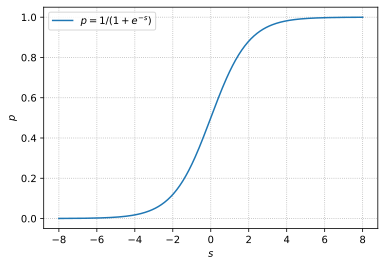

In [3]:
plt.figure(figsize=(6, 4))
s = np.linspace(-8, 8, 300)
p = 1 / (1 + np.exp(-s))

plt.plot(s, p, label="$p = 1 / (1 + e^{-s})$")
plt.xlabel("$s$")
plt.ylabel("$p$")
plt.legend()
plt.grid(linestyle="dotted");

Note that the sigmoid assigns $p =\frac{1}{2}$ at the hyperplane where $s = 0.$ It scales symmetrically with respect to the distance of the data points from the decision boundary. This is nice otherwise the prediction will not be invariant with respect to relabeling. For the general case of multiclass classification, we will have class scores $s_k = \mathbf{w}_k \cdot \mathbf{x}$ and the softmax will act like a voting function. See also [this video](https://www.youtube.com/watch?v=p-6wUOXaVqs) for deeper reasons on why the softmax works for neural networks.

In [4]:
w = np.array([1, 1])
b = 0

# Grid of points
x = np.linspace(-5, 5, 100)
y = np.linspace(-5, 5, 100)
X, Y = np.meshgrid(x, y)

# Effect of neural unit on input space
def sigmoid_unit(x, y):
    z = w[0] * x + w[1] * y + b
    return 1 / (1 + np.exp(-z))

Z = sigmoid_unit(X, Y)

Sigmoid unit assigns a gradient along the normal of the hyperplane defined by $\mathbf{w}$ and $b$ in the input space $\mathbb{R}^d$ (here $d = 2$).

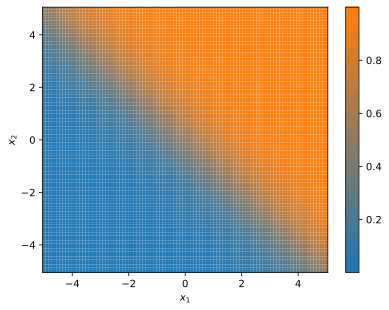

In [5]:
from matplotlib.colors import LinearSegmentedColormap

colors = ["C0", "C1"]
n_bins = 100
cm = LinearSegmentedColormap.from_list(name="", colors=colors, N=n_bins)

def plot_grid(X, Y, Z):
    plt.pcolormesh(X, Y, Z, shading='auto', cmap=cm)
    plt.colorbar()
    plt.xlabel('$x_1$')
    plt.ylabel('$x_2$')
    plt.show()

plot_grid(X, Y, Z)

ReLU unit has sharp cutoff at zero:

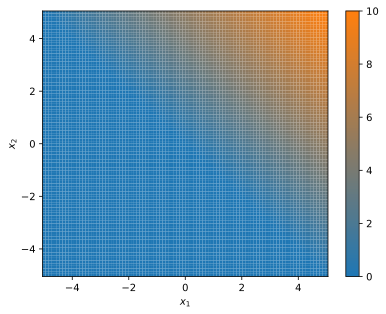

In [6]:
def relu_unit(x, y):
    z = w[0] * x + w[1] * y + b
    return np.maximum(0, z)

Z = relu_unit(X, Y)
plot_grid(X, Y, Z)

<br>

```{figure} ../../img/nn/01-sigmoid-1d.png
---
name: 01-sigmoid-1d
width: 80%
---
In the final layer, sigmoid assigns probabilities based on the distance from the hyperplane (i.e. collapsing the space onto 1-dimension). Source: [[CS182-lec2]](https://cs182sp21.github.io/static/slides/lec-2.pdf)
```

### Negative log loss (MLE)

The machine learning method follows four steps: defining a model, defining a loss function,
choosing an optimizer, and running it on large compute (e.g. GPUs). A **loss function** acts
a smooth surrogate to the true objective which may not be amenable to available optimization 
techniques. One approach called [maximum likelihood estimation](https://en.wikipedia.org/wiki/Maximum_likelihood_estimation#:~:text=In%20statistics%2C%20maximum%20likelihood%20estimation,observed%20data%20is%20most%20probable) (MLE) optimizes such that the dataset is more probable.
Given labeled [IID data](https://en.wikipedia.org/wiki/Independent_and_identically_distributed_random_variables) $\mathcal{D} = \{(\mathbf{x}_i, y_i)\}$, let

$$p(\mathcal{D}) = \prod_i p(y_i \mid \mathbf{x}_i).$$

The term $p(y_i \mid \mathbf{x}_i)$ is the true probability which we
model with a parametric function $p_{\boldsymbol{\Theta}}(y_i \mid \mathbf{x}_i)$. Probabilities are
small numbers in $[0, 1]$ and we are multiplying lots of them. So we apply the logarithm which is monotonic
and converts the product into a sum:

$$
\begin{aligned}
\log p(\mathcal{D}) 
&= \sum_i \log p_{\boldsymbol{\Theta}}(y_i \mid \mathbf{x}_i)
\end{aligned}
$$


MLE maximizes this probability with respect to the parameters $\boldsymbol{\Theta}.$ Consistent with optimization literature, we convert this to a minimization problem. Note that the first sum is independent of the parameters. The following becomes our loss function:

$$\boldsymbol{\Theta}^* = \text{argmin}_{\boldsymbol{\Theta}} -\sum_i \log p_{\boldsymbol{\Theta}}(y_i \mid \mathbf{x}_i).$$

**Remark.** This can be written more generally as $\boldsymbol{\Theta}^* = \text{argmin}_{\boldsymbol{\Theta}} \mathbb{E}\left[\ell(\boldsymbol{\Theta})\right]$ where $\ell$ is the loss function. This is any nonnegative function whose value approaches zero whenever the prediction of the network the target value. Above $\log p_{\boldsymbol{\Theta}}(y_i \mid \mathbf{x}_i) \to 0$ as $p_{\boldsymbol{\Theta}}(y_i \mid \mathbf{x}_i) \to 1.$ Using an expectation over the underlying distribution is nice because the model focuses on errors based on its probability of occuring. We will approximate this with the **empirical risk** on the sample $\mathcal{D}$ defined as

$$\mathcal{L}_\mathcal{D}(\boldsymbol{\Theta}) = \frac{1}{|\mathcal{D}|} \sum_i \ell(y_i, f_{\boldsymbol{\Theta}}(\mathbf{x}_i)).$$

### Optimization

Training neural networks is essentially an optimization problem with the loss as objective. Given the current parameters $\boldsymbol{\Theta} \in \mathbb R^d$ of the network, we can imagine the network to be sitting on a point $(\boldsymbol{\Theta}, \mathcal L_{\mathcal{D}}(\boldsymbol{\Theta}))$ on a surface in $\mathbb R^d \times \mathbb R.$ The surface will generally vary for different samples of the training data, but we except the surfaces to be similar for large enough samples that are independently drawn from the same distribution. Training is equivalent to finding the minimum of this surface. 
Gradients arise in deep learning when making the following first-order approximation to surface increment:

$$\Delta \mathcal L \approx  \sum_k \left(\frac{\partial \mathcal L}{ \partial {\Theta}_k} \right)  \Delta {\Theta}_k = \left( \nabla_{\boldsymbol{\Theta}}\, \mathcal L \right) \cdot \Delta {\boldsymbol{\Theta}}.$$ 

It follows that $-\nabla_{\boldsymbol{\Theta}}\, \mathcal L$ is the direction of steepest descent at the current point $(\boldsymbol{\Theta}, \mathcal L)$ in the surface. [Gradient descent](https://en.wikipedia.org/wiki/Gradient_descent) (GD) is defined by the update rule: $\boldsymbol{\Theta} \leftarrow \boldsymbol{\Theta} - \eta \nabla_{\boldsymbol{\Theta}}\, \mathcal L$ where $\eta > 0.$ The positive constant $\eta$ controls the step size in GD and is called the **learning rate**. Note that finding [initial weights](03-weight-init) $\boldsymbol{\Theta}_0 \in \mathbb{R}^d$ for this iterative process can be crucial for networks with lots of internal symmetries for it to converge. For now we will focus on efficiently computing the weight gradients. Later on we will see that other optimization algorithms in deep learning practice are just modifications of GD.

In [7]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # For 3D plotting
import numpy as np

def plot_surface(ax, data, target, N=50):
    x = np.linspace(-5, 5, N)
    y = np.linspace(-5, 5, N)
    X, Y = np.meshgrid(x, y)
    Z = np.zeros_like(X)
    for i in range(N):
        for j in range(N):
            Z[i, j] = loss(np.array([X[i, j], Y[i, j]]), data, target)
    
    ax.plot_surface(X, Y, Z, cmap='Reds')
    ax.set_xlabel(f'$w_0$')
    ax.set_ylabel(f'$w_1$')
    ax.set_title('loss surface')
    

def plot_contourf(ax, data, target, w_min, w_hist, N=50):
    x = np.linspace(-5, 5, N)
    y = np.linspace(-5, 5, N)
    X, Y = np.meshgrid(x, y)
    Z = np.zeros_like(X)
    for i in range(N):
        for j in range(N):
            Z[i, j] = loss(np.array([X[i, j], Y[i, j]]), data, target)

    c = ax.contourf(X, Y, Z, levels=20, cmap='Reds')
    ax.scatter(w_min[0], w_min[1], color="red", label='min')
    ax.scatter(w_hist[:, 0], w_hist[:, 1], marker='o', s=1, facecolors='k')
    ax.set_title('gradient descent')
    ax.set_xlabel(f'$w_0$')
    ax.set_ylabel(f'$w_1$')
    plt.colorbar(c, ax=ax)

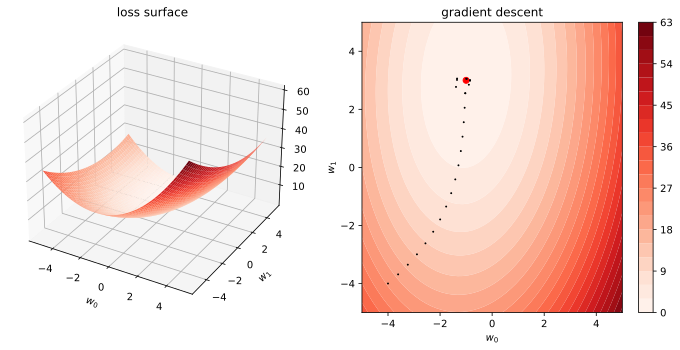

In [8]:
def loss(w, X, y):
    return ((X @ w - y)**2).mean()

def grad(w, X, y):
    """Gradient step for the MSE loss function"""
    dw = 2*((X @ w - y).reshape(-1, 1) * X).mean(axis=0)
    return dw / np.linalg.norm(dw)

def grad_descent(w0, X, y, eta=0.1, epochs=10):
    """Return sequence of weights from GD."""
    w = np.zeros([epochs, 2])
    w[0, :] = w0
    for j in range(1, epochs):
        u = w[j-1, :]
        w[j, :] = u - eta * grad(u, X, y)
    return w


# Generate data
n = 1000
X = np.zeros((n, 2))
X[:, 1] = np.random.uniform(low=-1, high=1, size=n)
X[:, 0] = 1
w_min = np.array([-1, 3])
y = (X @ w_min) + 0.05 * np.random.randn(n)  # data: y = -1 + 3x + noise

# Gradient descent
w_init = [-4, -4]
w_step = grad_descent(w_init, X, y, eta=0.5, epochs=25)

# Create a figure and two subplots
fig = plt.figure(figsize=(10, 5))
ax1 = fig.add_subplot(121, projection='3d')  # 3D subplot on the left
ax2 = fig.add_subplot(122)                   # contourf subplot on the right

# Call the functions with the respective axes
plot_surface(ax1, X, y)
plot_contourf(ax2, X, y, w_min, w_step)
plt.tight_layout()
plt.show()

**Figure.** Loss surface (left) and gradient descent (right) of a linear function with MSE loss.

### Nonlinear decision boundary

Going back to classification. Let us generate data that is **not** linearly separable. It turns out that linear classification can be extended to data that is not linearly separable.

In [9]:
import torch 
torch.manual_seed(0)

N = 600 # sample size
noise = lambda e: torch.randn(N, 2) * e
t = 2 * torch.pi * torch.rand(N, 1)
x1 = torch.cat([1.0 * torch.cos(t), 1.0 * torch.sin(t)], dim=1) + noise(0.1)
x0 = torch.cat([0.1 * torch.cos(t), 0.1 * torch.sin(t)], dim=1) + noise(0.05)
y1 = (torch.ones(N,) * 1).long()
y0 = (torch.ones(N,) * 0).long()

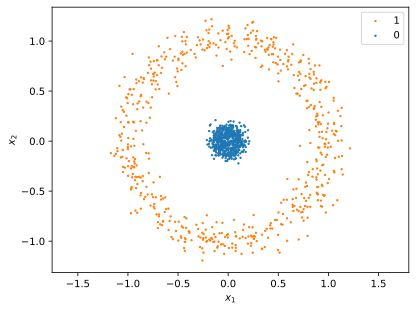

In [10]:
plt.scatter(x1[:, 0], x1[:, 1], s=2.0, label=1, color="C1")
plt.scatter(x0[:, 0], x0[:, 1], s=2.0, label=0, color="C0")
plt.xlabel("$x_1$")
plt.ylabel("$x_2$")
plt.legend()
plt.axis('equal');

Modeling this with a fully-connected neural network with layers containing 2-6-2 units. The hidden units have ReLU activation which simply maps $x \mapsto \max(0, x)$. As shown above, each unit separates its input space along the normal of the hyperplane defined by its weight $\mathbf{w}$ and bias $b$. For the ReLU this gradient is sharp at the boundary, zero in the opposite side and lineary increasing along the direction of the weight vector $\mathbf{w}.$ This is the immediate representation which gets passed to the next layer. 

In [11]:
import torch.nn as nn
from torchsummary import summary

model = lambda: nn.Sequential(
    nn.Linear(2, 6), 
    nn.ReLU(),
    nn.Linear(6, 2)
)

summary(model(), input_size=(2,))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                    [-1, 6]              18
              ReLU-2                    [-1, 6]               0
            Linear-3                    [-1, 2]              14
Total params: 32
Trainable params: 32
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 0.00
----------------------------------------------------------------


Gradient descent on the [cross-entropy loss](https://en.wikipedia.org/wiki/Cross-entropy) (equivalent to NLL):

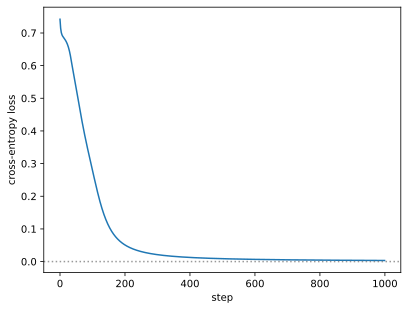

In [12]:
import torch.nn.functional as F

net = model()
loss_fn = lambda logits, y: F.cross_entropy(logits, y)
optim = torch.optim.SGD(net.parameters(), lr=0.3)

x = torch.cat([x0, x1])
y = torch.cat([y0, y1])
history = []
for step in range(1000):
    logits = net(x)
    loss = loss_fn(logits, y)
    loss.backward()
    optim.step()
    optim.zero_grad()
    history.append(loss.item())
    
plt.plot(history)
plt.axhline(0.0, linestyle="dotted", color="grey", alpha=0.8)
plt.xlabel("step")
plt.ylabel("cross-entropy loss");

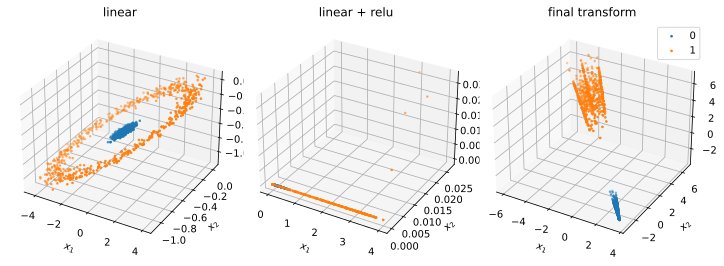

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# transformations
x0_3d = net[0](x0).detach().numpy()
x1_3d = net[0](x1).detach().numpy()
x0_3d_relu = net[1](net[0](x0)).detach().numpy()
x1_3d_relu = net[1](net[0](x1)).detach().numpy()
x0_final = net(x0).detach().numpy()
x1_final = net(x1).detach().numpy()

# plot
fig, ax = plt.subplots(ncols=3, figsize=(10, 16), subplot_kw={'projection': '3d'})
ax[0].scatter(x0_3d[:, 0], x0_3d[:, 1], x0_3d[:, 1], s=3, label=0, color="C0")
ax[0].scatter(x1_3d[:, 0], x1_3d[:, 1], x1_3d[:, 1], s=3, label=1, color="C1")
ax[0].set_xlabel('$x_1$')
ax[0].set_ylabel('$x_2$')
ax[0].set_title('linear')

ax[1].scatter(x0_3d_relu[:, 0], x0_3d_relu[:, 1], x0_3d_relu[:, 1], s=3, label=0, color="C0")
ax[1].scatter(x1_3d_relu[:, 0], x1_3d_relu[:, 1], x1_3d_relu[:, 1], s=3, label=1, color="C1")
ax[1].set_xlabel('$x_1$')
ax[1].set_ylabel('$x_2$')
ax[1].set_title('linear + relu')

ax[2].scatter(x0_final[:, 0], x0_final[:, 1], x0_final[:, 1], s=3, label=0, color="C0")
ax[2].scatter(x1_final[:, 0], x1_final[:, 1], x1_final[:, 1], s=3, label=1, color="C1")
ax[2].set_xlabel('$x_1$')
ax[2].set_ylabel('$x_2$')
ax[2].set_title('final transform')

fig.tight_layout()
plt.legend()
plt.show()

Seems linearly separable. Checking classification accuracy:

In [14]:
a = (torch.argmax(net(x0), dim=1) == y0).float().mean().item()
b = (torch.argmax(net(x1), dim=1) == y1).float().mean().item()
a, b

(1.0, 1.0)

Plotting the decision surface on the input space. Note that we have to convert logits to probabilities:

In [15]:
def prediction(x, y):
    p = F.softmax(net(torch.tensor([[x, y]])), dim=1)
    return p[0, 1].item()

In [16]:
from matplotlib.colors import LinearSegmentedColormap

# Define your custom colormap
colors = ["C0", "C1"]
n_bins = 100
cm = LinearSegmentedColormap.from_list(name="", colors=colors, N=n_bins)

# Create a grid of points
N = 100
x = np.linspace(-1.5, 1.5, N)
y = np.linspace(-1.5, 1.5, N)
X, Y = np.meshgrid(x, y)

# Calculate function values for each point on the grid
Z = np.zeros_like(X)
for i in range(N):
    for j in range(N):
        Z[i, j] = prediction(float(X[i, j]), float(Y[i, j]))

# Create a color plot using the custom colormap
plt.pcolormesh(X, Y, Z, shading='auto', cmap=cm)
plt.colorbar()
plt.xlabel('X')
plt.ylabel('Y')

plt.scatter(x1[:, 0], x1[:, 1], s=10.0, label=1, color="C1", edgecolor="black")
plt.scatter(x0[:, 0], x0[:, 1], s=10.0, label=0, color="C0", edgecolor="black")
plt.xlabel("$x_1$")
plt.ylabel("$x_2$")
plt.legend()
plt.axis('equal');

plt.xlim(-1.5, 1.5)
plt.ylim(-1.5, 1.5)
plt.show();

**Figure.** Probability assigned by the trained network on the input space. Note that we were able to extend linear classification to learning a nonlinear decision boundary. Notice the sharpness in the boundary which is an artifact of using ReLU. This can be thought of as a manifestation of inductive bias.

## Empirical Risk Minimization (ERM)

Recall we defined **empirical risk** as $\mathcal{L}_\mathcal{D}(\boldsymbol{\Theta}) = \frac{1}{|\mathcal{D}|} \sum_i \ell(y_i, f_{\boldsymbol{\Theta}}(\mathbf{x}_i)).$ It is natural to ask whether this approximates the **true risk** $\mathbb{E}[\ell(y, f(\mathbf{x}))]$ where $f$ is the true function underlying the process. There are two things to watch out for when training neural networks:

* **Overfitting.** This occurs when the empirical risk is low but the true risk is high. This can happen if the dataset is too small and not representative of the true distribution. Or if the model is too powerful. Having too high capacity will interpolate the sample, but will have arbitrary behavior between datapoints.

+++

* **Underfitting.** Here both empirical risk and true risk are high. This can happen if the model is too weak (low capacity, or too few parameters). Or if the optimizer is not configured well (e.g. wrong learning rate).

<br>

Observe that MLE is by definition prone to overfitting. We rely on smoothness between data points for the model to generalize to test data. It is important to analyze the error between different **training sets**. A well-trained model should not look too different between samples. See {numref}`01-overfitting-underfitting`. But we also don't want it to have the same errors with different data!

<br>

```{figure} ../../img/nn/01-overfitting-underfitting.png
---
name: 01-overfitting-underfitting
width: 100%
---
Drawing of a model that overfits and underfits the distribution. Source: [[CS182-lec3]](https://cs182sp21.github.io/static/slides/lec-3.pdf)
```

### Bias-variance tradeoff

Let us analyze the squared error of trained models. See [these notes](https://www.cs.cornell.edu/courses/cs4780/2018sp/lectures/lecturenote12.html) for a more careful treatment. Let $f_{\mathcal{D}}$ be the function obtained by training over the sample $\mathcal{D}$ and let $\bar{f}$ be the expected function when drawing fixed sized samples $\mathcal{D} \stackrel{\text{iid}}{\sim} P^n$ where $n = |\mathcal{D}|$ and $P$ is the underlying data distribution. In other words, $\bar{f}$ is an ensemble of trained models weighted by the probability of its training dataset. Then:

$$
\begin{aligned}
\mathbb{E}_{\mathbf{x}, \mathcal{D}}\left[ \left(f_{\mathcal{D}}(\mathbf{x}) - f(\mathbf{x}) \right)^2 \right]
&= \mathbb{E}_{\mathbf{x}, \mathcal{D}}\left[ \left((f_{\mathcal{D}}(\mathbf{x}) - \bar{f}(\mathbf{x})) + (\bar{f}(\mathbf{x}) - f(\mathbf{x})) \right)^2 \right] \\
&= \mathbb{E}_{\mathbf{x}, \mathcal{D}}\left[ (f_{\mathcal{D}}(\mathbf{x}) - \bar{f}(\mathbf{x}))^2 \right] 
+ 2\, \mathbb{E}_{\mathbf{x}, \mathcal{D}}\left[(f_{\mathcal{D}}(\mathbf{x}) - f(\mathbf{x}))(\bar{f}(\mathbf{x}) - f(\mathbf{x})) \right] + \mathbb{E}_{\mathbf{x}, \mathcal{D}}\left[(\bar{f}(\mathbf{x}) - f(\mathbf{x}))^2 \right] \\
&= \mathbb{E}_{\mathbf{x}, \mathcal{D}}\left[ (f_{\mathcal{D}}(\mathbf{x}) - \bar{f}(\mathbf{x}))^2 \right] 
+ 0 + \mathbb{E}_{\mathbf{x}, \mathcal{D}}\left[(\bar{f}(\mathbf{x}) - f(\mathbf{x}))^2 \right] \\
&= \underbrace{\mathbb{E}_{\mathbf{x}, \mathcal{D}}\left[ (f_{\mathcal{D}}(\mathbf{x}) - \bar{f}(\mathbf{x}))^2 \right]}_{\text{Variance}} 
 + \underbrace{\mathbb{E}_{\mathbf{x}}\left[(\bar{f}(\mathbf{x}) - f(\mathbf{x}))^2 \right]}_{\text{Bias}^2}. \\
\end{aligned} \\
$$

The middle term vanishes by writing it as: 

$$
\mathbb{E}_{\mathbf{x}} \left[\underbrace{\mathbb{E}_{\mathcal{D}}\left[(f_{\mathcal{D}}(\mathbf{x}) - f(\mathbf{x}))\right]}_{0} \; (\bar{f}(\mathbf{x}) - f(\mathbf{x}))  \right] = 0.
$$

Observe that the **variance** term describes sample dependent errors with respect to the ensemble function. It measures deviation between training without actually looking into the true function. The **bias** term, on the other hand, looks at the error of the ensemble $\bar{f}$ from the true function $f.$ These can be visualized as manifesting in the left and right plots respectively of {numref}`01-overfitting-underfitting`.

**Classical tradeoff.** There is a tradeoff with respect to model complexity for fixed $n.$ If we increase model complexity, these models will have higher variance but lower bias. Overfitting occurs when a model is too complex that it captures noise in the dataset. On the other hand, simpler models will have low bias, since they tend to saturate to the same function, but this also means higher bias. 
Note that using larger $n$ can decrease variance as more data will result in drowning out noise, and are insensitive to noise. But bias does not go away no matter how much data we have! Hence, it is nicer to have more complex models whose complexity we later control (see next section).

**Double descent.** Moreover, there is the phenomenon of **double descent** {cite}`double-descent` observed in most networks used in practice where both bias and variance go down with excess complexity. See [this interview](https://www.youtube.com/watch?v=W_TAKJRgrbs) by one of the authors. One intuition is that near the interpolation threshold where there is roughly a 1-1 correspondence between all the sample datasets and the models, small changes in the dataset lead to large changes in the model (overfitting). Having more data destroys this 1-1 correspondence, which is covered by the classical regime described above. Double descent occurs in the opposite case where we have much more parameters than data, and the overparametrized network tends to be smooth between data points.

<br>

```{figure} ../../img/nn/01-double-descent.png
---
name: 01-double-descent
width: 80%
---
Double descent for ResNet18. The width parameter controls model complexity. Source: {cite}`double-descent`
```

<br>

```{figure} ../../img/nn/01-double-descent-data.png
---
name: 01-double-descent-data
width: 90%
---
More data can hurt test performance of a model compared to the same model trained on a smaller dataset. 
This is because additional data can increase variance in the critical regime.
But increasing complexity will eventually result in better performance.
Source: {cite}`double-descent`
```

<br>

```{figure} ../../img/nn/01-double-descent-epochs.png
---
name: 01-double-descent-epochs
width: 100%
---
Larger models require more training, so larger epochs is required for double descent to occur. Source: {cite}`double-descent`
```

### Regularization

In [192]:
import warnings
from sklearn.linear_model import Ridge, Lasso
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
warnings.simplefilter("ignore")

# data
x = np.linspace(-2*np.pi, 2*np.pi, 1000)
y = np.sin(x) + 0.3 * x

def model(degree, sample_size, alpha=0.0):
    B = torch.randint(0, 1000, size=(sample_size,))
    B = torch.sort(B)[0]
    xs = x[B]
    ys = y[B]

    poly = PolynomialFeatures(degree=degree)
    ridge_model = make_pipeline(poly, Ridge(alpha=alpha))
    ridge_model.fit(xs.reshape(-1, 1), ys.reshape(-1, 1))
    return ridge_model.predict(x.reshape(-1, 1)).reshape(-1)

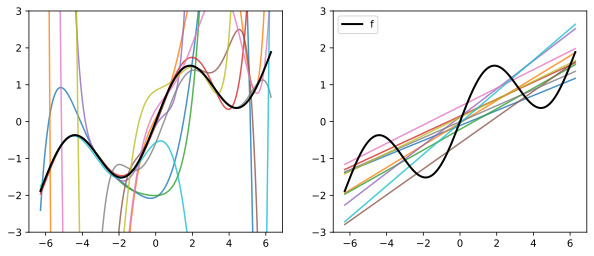

In [237]:
poly_models = []
for i in range(10):
    poly_models.append(model(degree=6, sample_size=6))

linear_models = []
for i in range(10):
    linear_models.append(model(degree=1, sample_size=6))


fig, ax = plt.subplots(1, 2, figsize=(10, 4))

for t in poly_models:
    ax[0].plot(x, t, alpha=0.8)

for t in linear_models:
    ax[1].plot(x, t, alpha=0.8)
    

ax[0].plot(x, y, color="black", linewidth=2, label="f")
ax[1].plot(x, y, color="black", linewidth=2, label="f")
ax[0].set_ylim(-3, 3)
ax[1].set_ylim(-3, 3)
ax[1].legend();

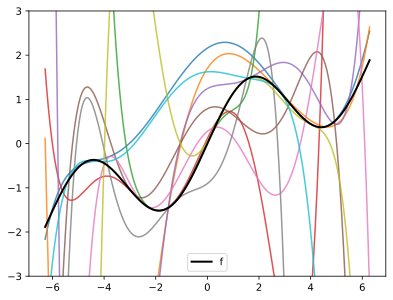

41.349157945689186


In [233]:
poly_models = []
for i in range(10):
    poly_models.append(model(degree=6, sample_size=6))

for t in poly_models:
    plt.plot(x, t, alpha=0.8)

plt.plot(x, y, color="black", linewidth=2, label="f")
plt.ylim(-3, 3)
plt.legend()
plt.show()

error = 0
for t in poly_models:
    error += (((y[30:-30] - t[30:-30]) ** 2).mean()) ** 0.5
print(error / len(poly_models))

Capacity just right:

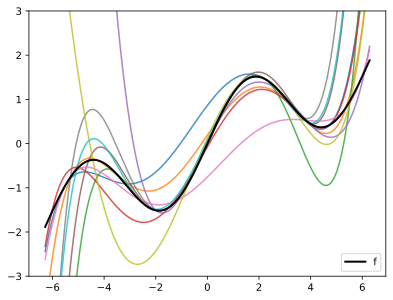

1.8901723277746423


In [234]:
poly_models = []
for i in range(10):
    poly_models.append(model(degree=5, sample_size=6))

for t in poly_models:
    plt.plot(x, t, alpha=0.8)

plt.plot(x, y, color="black", linewidth=2, label="f")
plt.ylim(-3, 3)
plt.legend()
plt.show()

error = 0
for t in poly_models:
    error += (((y[30:-30] - t[30:-30]) ** 2).mean()) ** 0.5
print(error / len(poly_models))

More data:

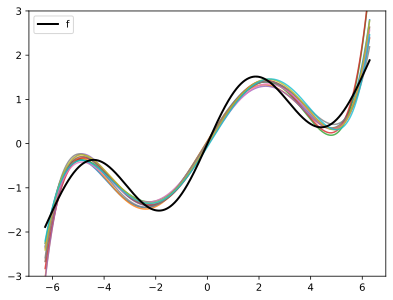

0.20691374493528344


In [235]:
poly_models = []
for i in range(10):
    poly_models.append(model(degree=6, sample_size=100))

for t in poly_models:
    plt.plot(x, t, alpha=0.8)

plt.plot(x, y, color="black", linewidth=2, label="f")
plt.ylim(-3, 3)
plt.legend()
plt.show()

error = 0
for t in poly_models:
    error += (((y[30:-30] - t[30:-30]) ** 2).mean()) ** 0.5
print(error / len(poly_models))

Regularization:

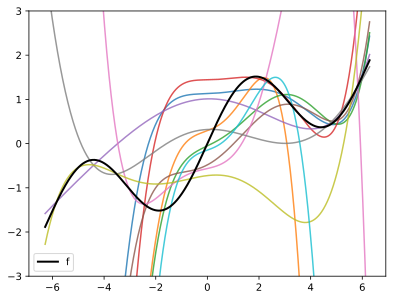

15.39129191613208


In [236]:
poly_models = []
for i in range(10):
    poly_models.append(model(degree=5, sample_size=6, alpha=5.0))

for t in poly_models:
    plt.plot(x, t, alpha=0.8)

plt.plot(x, y, color="black", linewidth=2, label="f")
plt.ylim(-3, 3)
plt.legend()
plt.show()

error = 0
for t in poly_models:
    error += (((y[30:-30] - t[30:-30]) ** 2).mean()) ** 0.5
print(error / len(poly_models))

In [231]:
len(y)

1000

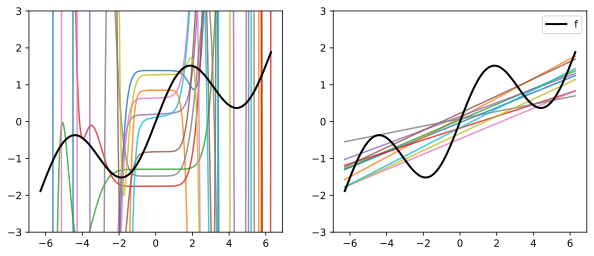

In [191]:
poly_models = []
for i in range(10):
    poly_models.append(model(degree=6, sample_size=6))

linear_models = []
for i in range(10):
    linear_models.append(model(degree=1, sample_size=6))


fig, ax = plt.subplots(1, 2, figsize=(10, 4))

for t in poly_models:
    ax[0].plot(x, t, alpha=0.8)

for t in linear_models:
    ax[1].plot(x, t, alpha=0.8)
    

ax[0].plot(x, y, color="black", linewidth=2, label="f")
ax[1].plot(x, y, color="black", linewidth=2, label="f")
ax[0].set_ylim(-3, 3)
ax[1].set_ylim(-3, 3)
ax[1].legend();

How to regulate bias/variance
- get more data (addresses variance, no effect on bias)
- change model class

use 12th degree polynomial.
this is discrete 
can we smoothly regulate model class?
sort of a "continuous know" for complexity


Regularization

- something we add to the loss to reduce variance (i.e. data sensitivity)
- bayesian interpretation: prior belief about parameters

high level intuition
- high variance: data does not give enough info to identify parameters
- if data not enough, how bout loss?
- enough info to pick between models, we can get the right one
- for example: Loss prefers smooth transition between datapoints.

shape of regularizers
- L1 prefers zero for unimportant features (sparse)
- L2 prefers smoothed
- dropout
- gradient penalty

other interpretation:
- regularizer makes undetermined problems well-determined
- regularizer makes loss landscape easier to search
- can reduce underfitting if due to optimization (common with GANs).

regularization tradeoff cycle
- train loss, valid loss tradeoff
- want low train loss, low validation loss pareto curve (plot this)

early stop?
- nope overfits validation
- does it mitigate all overfitting?
- no. what if we used a more appropriate regularization method

test set
- fixes validation loss overfitting

### Generating data

## MNIST classification

### Data loaders

In [17]:
import torchvision.datasets as datasets
import torchvision.transforms as transforms

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x/255.)
])

mnist_train = datasets.MNIST(
    root='./data', 
    train=True,  
    download=True,
    transform=transform
)

mnist_valid = datasets.MNIST(
    root='./data', 
    train=False, 
    download=True,
    transform=transform
)

dl_train = DataLoader(mnist_train, batch_size=50, shuffle=True, drop_last=True)
dl_valid = DataLoader(mnist_valid, batch_size=50)

NameError: name 'DataLoader' is not defined

Checking one batch:

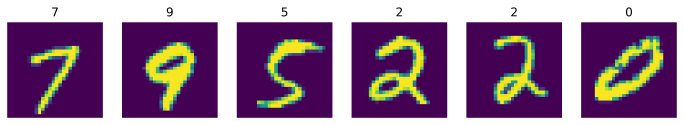

In [ ]:
x, y = next(iter(dl_train))

fig, ax = plt.subplots(1, 6, figsize=(12, 3))
for i in range(6):
    ax[i].imshow(x[i].permute(1, 2, 0))
    ax[i].axis("off")
    ax[i].set_title(y[i].item())

### Model architecture

In [ ]:
act_fn = {
    "relu": nn.ReLU(),
    "tanh": nn.Tanh(),
    "sigmoid": nn.Sigmoid()
}

def mnist_model(
        hidden_layers: int = 0,
        activation: str = None,
        hidden_size: int = 100,
        input_size: int = 784
    ):
    
    layers = [nn.Flatten()]

    m, n = input_size, hidden_size
    for i in range(hidden_layers):
        layers.append(nn.Linear(m, n))
        if activation:
            layers.append(act_fn[activation])
        m, n = hidden_size, hidden_size

    layers.append(nn.Linear(m, 10))
    model = nn.Sequential(*layers)

    return model


summary(mnist_model(3), input_size=(1, 28, 28))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
           Flatten-1                  [-1, 784]               0
            Linear-2                  [-1, 100]          78,500
            Linear-3                  [-1, 100]          10,100
            Linear-4                  [-1, 100]          10,100
            Linear-5                   [-1, 10]           1,010
Total params: 99,710
Trainable params: 99,710
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.01
Params size (MB): 0.38
Estimated Total Size (MB): 0.39
----------------------------------------------------------------


### Training

In [ ]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

device = torch.device("mps")


@torch.no_grad()
def evaluate(model, dataloader):
    loss = 0
    correct = 0
    N = 0
    for x, y in dataloader:
        x = x.to(device)
        y = y.to(device)
        logits = model(x)

        loss += F.cross_entropy(logits, y, reduction='sum').item()
        correct += sum(torch.argmax(logits, dim=1) == y).item()
        N += len(x)
    
    return {
        "loss": loss / N,
        "accs": correct / N
    }


def train_model(
        train_loader, 
        valid_loader,
        epochs=10, 
        hidden_layers=0, 
        activation=None, 
        input_size=784
    ):

    model = mnist_model(hidden_layers, activation, input_size=input_size).to(device)
    optim = torch.optim.Adam(model.parameters(), lr=0.001)

    train_loss = []
    valid_loss = []
    valid_accs = []

    for epoch in tqdm(range(epochs)):
        for x, y in train_loader:
            x = x.to(device)
            y = y.to(device)
            logits = model(x)
            
            loss = F.cross_entropy(logits, y)
            loss.backward()
            optim.step()
            optim.zero_grad()
            
            train_loss.append(loss.item())

        e = evaluate(model, valid_loader)
        valid_loss.append(e["loss"])
        valid_accs.append(e["accs"])
            
    return {
        "model": model,
        "train_loss": train_loss,
        "valid_loss": valid_loss,
        "valid_accs": valid_accs
    }

### Experiments

Effect of activation and depth on training:

In [ ]:
experiments = [
    {"hidden_layers":  0, "activation": None},
    {"hidden_layers":  1, "activation": None},
    {"hidden_layers":  1, "activation": "sigmoid"},
    {"hidden_layers": 10, "activation": "sigmoid"},
    {"hidden_layers":  1, "activation": "tanh"},
    {"hidden_layers":  1, "activation": "relu"},
    {"hidden_layers":  3, "activation": "relu"},
    {"hidden_layers": 10, "activation": "relu"},
]

results = {}

for params in experiments:
    results[tuple(params.values())] = train_model(dl_train, dl_valid, **params)

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Plotting the results:

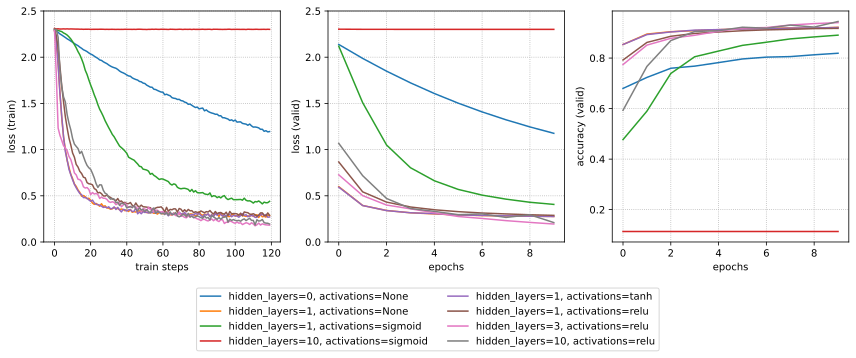

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4))

for i, (params, hist) in enumerate(results.items()):
    ax[0].plot(torch.tensor(hist['train_loss']).view(-1, 100).mean(dim=1), color=f"C{i}")
    ax[1].plot(hist['valid_loss'], color=f"C{i}")
    ax[2].plot(hist['valid_accs'], label=f"hidden_layers={params[0]}, activations={params[1]}", color=f"C{i}")

ax[0].set_xlabel("train steps")
ax[1].set_xlabel("epochs")
ax[2].set_xlabel("epochs")
ax[0].grid(linestyle='dotted')
ax[1].grid(linestyle='dotted')
ax[2].grid(linestyle='dotted')
ax[0].set_ylabel("loss (train)")
ax[1].set_ylabel("loss (valid)")
ax[2].set_ylabel("accuracy (valid)")
ax[1].set_ylim(0, 2.5)
ax[0].set_ylim(0, 2.5)

fig.legend(bbox_to_anchor=(0.5, -0.25), loc='lower center', ncol=2)
fig.tight_layout();

**Results.** 10 layers with sigmoid is remarkably bad. This is because of repeated squashing. ReLU networks perform well benefiting from added depth (although not too much). Tanh with a derivative of 1 at zero improves the performance of sigmoid.

## Appendix: Principal Component Analysis (PCA)

PCA looks for a hyperplane (e.g. with dimension $n \ll d$) such that the projection of the $d$-dimensional data on the hyperplane has iteratively maximal variance starting from the first orthonormal vector. In other words, the data is projected on a hyperplane such that the projected data points have maximal separability along each dimension.


![pca-ds-handbook](https://jakevdp.github.io/PythonDataScienceHandbook/figures/05.09-PCA-rotation.png)

**Figure.** PCA on a blob of data (left). Components in PCA space also shown (right). [Source]( https://jakevdp.github.io/PythonDataScienceHandbook/05.09-principal-component-analysis.html )

### PCs = eigenvectors

Let $\boldsymbol{\mathsf{S}} \in \mathbb{R}^{d \times d}$ be the sample covariance of the data. PCA starts with the optimization problem $\max_{\boldsymbol{\mathsf{u}}_1} {{\boldsymbol{\mathsf{u}}_1}^{\top}}\,\boldsymbol{\mathsf{S}}\,{\boldsymbol{\mathsf{u}}_1}$ such that ${{\boldsymbol{\mathsf{u}}_1}^{\top}}{\boldsymbol{\mathsf{u}}_1} = 1.$ The unit vector ${\boldsymbol{\mathsf{u}}_1}$ is called the first **principal component** (PC). This can be solved using Lagrange multiplers where it turns out that the first principal components is the eigenvecter of $\boldsymbol{\mathsf{S}}$ corresponding to the largest eigenvalue. The eigenvalue $\lambda_1$ also turns out to be the variance along that dimension.

Recall that $\boldsymbol{\mathsf{S}}$ is symmetric positive semidefnite so that it has $d$ nonnegative eigenvalues with corresponding $d$ orthonormal eigenvectors. In particular, we can order the eigenvalues as $\lambda_1 \leq \lambda_2 \leq \ldots \leq \lambda_d.$ The next principal components can be solved using the same Lagrange multipliers method with added constraints due to its orthogonality with earlier principal components. But we still get the same results that the principal component is the eigenvector ${\boldsymbol{\mathsf{u}}_j}$ corresponding to the next largest eigenvalue $\lambda_j.$

**Remark.** See [this video](https://www.youtube.com/watch?v=L-pQtGm3VS8) on PCA and [this video](https://www.youtube.com/watch?v=5A39Ht9Wcu0) on understanding Lagrange multipliers.

### First principal component

Here we solve the first PC of MNIST train using [power iteration](https://en.wikipedia.org/wiki/Power_iteration):

In [ ]:
def sample_covariance(size):
    """Compute covariance matrix of subset of data."""
    B = torch.randint(0, len(mnist_train), size=(size,))
    data = [mnist_train[b][0].view(-1) for b in B]

    X = torch.stack(data, dim=0)
    m = X.mean(dim=0)
    cov = (X - m).T @ (X - m) / X.shape[0]
    
    return {
        'cov': cov,
        'mean': m
    }

Computing the sample covariance of 30,000 random data points:

In [ ]:
examples = len(mnist_train)
sample = sample_covariance(examples)
cov = sample['cov']
total_variance = cov.diag().sum()

Using power iteration we can approximate $\lambda_1 {\boldsymbol{\mathsf{u}}_1}$:

In [ ]:
iterations = 1024
v = torch.ones(784)
for i in range(iterations):
    v = v @ cov
    s = torch.norm(v)
    v = v / s

It follows that the norm of this vector is the explained variance by the first PC:

In [ ]:
print(f"--iterations={iterations} --examples={examples}")
print(f"Total variance: {total_variance:.5f}")
print(f"Explained variance: {(s / total_variance).item() * 100:.2f}%")

--iterations=1024 --examples=60000
Total variance: 0.00081
Explained variance: 9.67%


See below for an explanation of **explained variance**.

### Explained variance

Recall that the trace of a matrix is equal to the sum of its eigenvalues. For the covariance matrix $\boldsymbol{\mathsf{S}}$, its trace is also the sum of all variances of the sample data along each of the input dimension. 
In other words, the sum of the variances along each principal component is equal to the sum of the variances along the the original input dimensions.
Hence, we call $\text{trace}(\boldsymbol{\mathsf{S}}) = \sum_{j=1}^d \lambda_j$ the **total variance** of the sample data. Below we will compute $\lambda_j / \sum_{j=1}^d \lambda_j$ to measure the amount of variance "explained" by one principal component. 

Computing the total variance:

In [ ]:
print(f"Total variance:    {total_variance:.5f}")
print(f"Total eigenvalues: {torch.linalg.eigvals(cov).sum().real.item():.5f}")

Total variance:    0.00081
Total eigenvalues: 0.00081


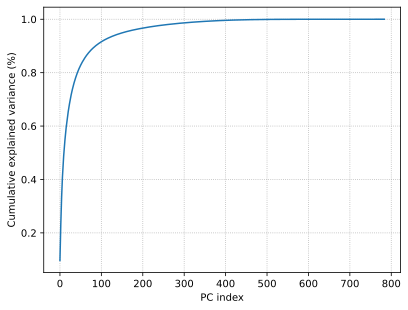

In [ ]:
cs = torch.cumsum(torch.linalg.eigvals(cov).real, dim=0)
plt.plot(cs / total_variance)
plt.grid(linestyle='dotted')
plt.ylabel("Cumulative explained variance (%)")
plt.xlabel("PC index");

**Remark.** This graph shows that we can preserve a significant percentage of the total variance by using only a small number of dimensions (e.g. ~100). See next section.

### PC decomposition

Note that the principal components are orthonormal vectors which can form a **basis** of the data space. The components along each dimension can be obtained using projection. The following reconstructs an instance using this technique of PCs as basis. The approximation should get better as we use more basis vectors (refer to the graph above):

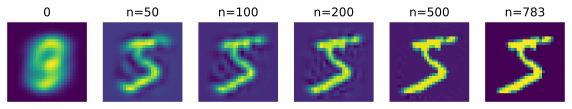

In [ ]:
# Sample data point
x, y = mnist_train[0]
x = x.view(-1)

eigvecs = torch.linalg.eig(cov).eigenvectors.real.T # 👈 >_<, (try without .T)
m = torch.clone(sample['mean'])

checkpoints = [50, 100, 200, 500, 783]
fig, ax = plt.subplots(1, len(checkpoints) + 1, figsize=(10, 3))
x_pca = m
ax[0].set_title(0)
ax[0].imshow(x_pca.view(28, 28))
ax[0].axis('off')

j = 1
for i in range(784):
    u = eigvecs[i]
    x_pca += ((x - m) @ u) * u
    if i + 1 in checkpoints:
        ax[j].set_title(f"n={i+1}")
        ax[j].imshow(x_pca.view(28, 28))
        ax[j].axis('off')
        j += 1

Principal components:

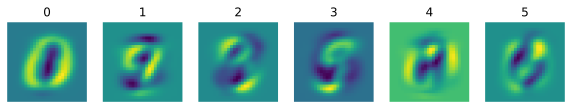

In [ ]:
fig, ax = plt.subplots(1, 6, figsize=(10, 3))

for i in range(6):
    u = eigvecs[i]
    ax[i].set_title(i)
    ax[i].imshow(u.view(28, 28))
    ax[i].axis('off')

### Dimensionality reduction

Here we project MNIST onto a 200-dimensional hyperplane (i.e. obtained using the first 200 principal components). This section also presents PCA in the framework of machine learning by using the training set to compute the PCs and then applying them on the validation dataset:

In [ ]:
class PCA:
    def __init__(self, n_components):
        self.n_components = n_components

        # learned stuff
        self.cov = None
        self.mean = None
        self.components = None
        self.variances = None


    def fit(self, X):
        
        # compute sample covariance
        m = X.mean(dim=0)
        cov = (X - m).T @ (X - m) / X.shape[0]
        self.cov = cov
        self.mean = m

        # compute principal components
        eigvals, eigvecs = torch.linalg.eig(cov)
        self.components = eigvecs.real.T    # (!)
        self.variances  = eigvals.real
        
        n = self.n_components
        U = self.components[:n]
        explained_variance = sum(self.variances[:n]) / sum(self.variances)
        mae = (X - self.transform(X) @ U).abs().mean()
        print(f"Explained variance: {explained_variance * 100:.2f}%")
        print(f"MAE train: {mae: .2e}")


    def transform(self, x):
        if len(x.shape) != 2:
            raise Exception("Input must have dimension 2.")
        
        U = self.components[:self.n_components]
        m = self.mean
        return (x - m) @ U.T


    def explained_variance(self):
        if self.components is not None:
            cs = torch.cumsum(self.variances, dim=0)
            total_variance = sum(self.variances)
            return (cs / total_variance).tolist()
        else:
            raise Exception("PCA object not trained.")

**Remark.** Note that the eigenvector matrix has columns as eigenvectors. Hence the `.T` to get rows.

In [ ]:
pca = PCA(n_components=200)
data = [mnist_train[b][0].view(-1) for b in range(len(mnist_train))]
X = torch.stack(data, dim=0)
pca.fit(X)

Explained variance: 96.64%
MAE train:  5.29e-04


Custom transform using the PCA object:

In [ ]:
X_train, Y_train = zip(*[mnist_train[b] for b in range(len(mnist_train))])
X_valid, Y_valid = zip(*[mnist_valid[b] for b in range(len(mnist_valid))])

X_train = torch.stack(X_train, dim=0).view(-1, 784)
X_valid = torch.stack(X_valid, dim=0).view(-1, 784)

X_train_pca = pca.transform(X_train)
X_valid_pca = pca.transform(X_valid)

ds_train_pca = TensorDataset(X_train_pca, torch.tensor(Y_train))
ds_valid_pca = TensorDataset(X_valid_pca, torch.tensor(Y_valid))
dl_train_pca = DataLoader(ds_train_pca, batch_size=50, shuffle=True, drop_last=True)
dl_valid_pca = DataLoader(ds_valid_pca, batch_size=50)

Reconstructing MNIST instances using 200 components:

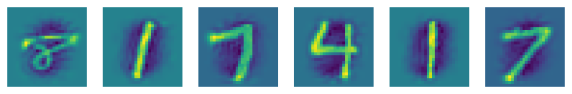

In [ ]:
x_pca, y = next(iter(dl_train_pca))
U = pca.components[:200]
x_recon = x_pca @ U

fig, ax = plt.subplots(1, 6, figsize=(10, 4))
for i in range(6):
    ax[i].imshow(x_recon[i].view(28, 28))
    ax[i].axis("off");

Looks good. Model trained on PCA data performed well:

In [ ]:
params = {"hidden_layers": 1, "activation": "sigmoid", "input_size": 200}
result_pca = train_model(dl_train_pca, dl_valid_pca, **params)

  0%|          | 0/10 [00:00<?, ?it/s]

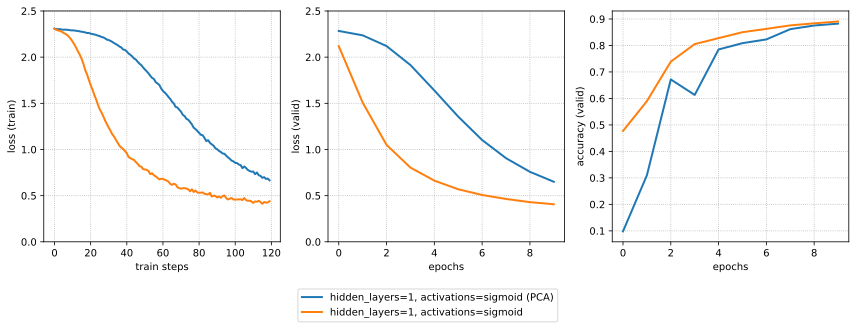

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4))

ax[0].plot(torch.tensor(result_pca['train_loss']).view(-1, 100).mean(dim=1), linewidth=2)
ax[1].plot(result_pca['valid_loss'], linewidth=2)
ax[2].plot(result_pca['valid_accs'], label=f"hidden_layers={params['hidden_layers']}, activations={params['activation']} (PCA)", linewidth=2)

ax[0].plot(torch.tensor(results[(1, 'sigmoid')]['train_loss']).view(-1, 100).mean(dim=1), linewidth=2)
ax[1].plot(results[(1, 'sigmoid')]['valid_loss'], linewidth=2)
ax[2].plot(results[(1, 'sigmoid')]['valid_accs'], label=f"hidden_layers=1, activations=sigmoid", linewidth=2)

ax[0].set_xlabel("train steps")
ax[1].set_xlabel("epochs")
ax[2].set_xlabel("epochs")
ax[0].grid(linestyle='dotted')
ax[1].grid(linestyle='dotted')
ax[2].grid(linestyle='dotted')
ax[0].set_ylabel("loss (train)")
ax[1].set_ylabel("loss (valid)")
ax[2].set_ylabel("accuracy (valid)")
ax[1].set_ylim(0, 2.5)
ax[0].set_ylim(0, 2.5)

fig.legend(bbox_to_anchor=(0.5, -0.15), loc='lower center', ncol=1)
fig.tight_layout();

---

In [ ]:
from datetime import datetime

now = datetime.now()
dt_string = now.strftime("%d/%m/%Y %H:%M:%S")
print("Last updated:", dt_string)

Last updated: 01/06/2023 06:11:33
